In [1]:
!git clone https://github.com/AbhiRathore/hackfiles.git ## repository of the files 

Cloning into 'hackfiles'...
remote: Enumerating objects: 8, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 8 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (8/8), done.


### Importing Libraries

In [2]:
import pandas as pd
import re,sys,os
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix,classification_report,roc_auc_score
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold
from scipy import stats

%matplotlib inline 

maindir = "./hackfiles/"
trainfname = "train_Df64byy.csv"
testfname = "test_YCcRUnU.csv"

In [3]:

from google.colab import drive ## to mount google drive so that files can be automatically saved there - Follow the instructions after running this command
drive.mount('/content/gdrive') 

Mounted at /content/gdrive


In [4]:
sampsub = pd.read_csv(maindir + 'sample_submission_QrCyCoT.csv')
sampsub.head()

,ID,Response
0,50883,0
1,50884,0
2,50885,0
3,50886,0
4,50887,0


In [5]:
trainf = pd.read_csv(maindir + trainfname)


In [6]:
testf = pd.read_csv(maindir + testfname)

In [7]:
import re 
## preprocessing of the holding Policy duration column
def cleaner(x):
  if pd.notna(x) and x =='14+':
    return '15'
  else:
    return x

In [8]:
testf['Response'] = -999 ### adding a dummy value so that columns in train and test would be same

In [9]:
### merging the data frames 
totaldf = trainf.append(testf[trainf.columns])
totaldf.shape

(72687, 14)

In [10]:
totaldf['Holding_Policy_Duration'] = totaldf['Holding_Policy_Duration'].apply(lambda x:cleaner(x))

In [94]:
# totaldf['Holding_Policy_Duration'].fillna('0' ,inplace=True) ### filling 0 for the cases where holding policy is not there ( new customer)
 

In [11]:
totaldf['Holding_Policy_Duration'].fillna('-999' ,inplace=True) ### filling -999 for the cases where holding policy is not there ( new customer)


In [12]:
totaldf['Holding_Policy_Duration'] = totaldf['Holding_Policy_Duration'].astype('float')

In [13]:
### logic code to create Holding Policy duration bucket
def hpd_class(x):
  if x  >=1 and x < 5:
    return 'small'
  elif x >=5 and x <10:
    return 'mid'
  elif x >=10 and x < 15:
    return 'long'
  elif x >=15 :
    return 'vlong'
  else:
    return 'new'

In [14]:
totaldf['hpd']=totaldf['Holding_Policy_Duration'].apply(lambda x : hpd_class(x))

In [15]:
totaldf['agediff'] = totaldf['Upper_Age'] - totaldf['Lower_Age']

##using group level mode to impute data 


In [16]:
w = totaldf.pivot_table(index=['City_Code','Accomodation_Type','Reco_Insurance_Type'], columns='Health Indicator', aggfunc='size').reset_index()

In [17]:
def modefinder_hi(df):
  #print(df.columns)
  #print(df['X1'])
  v = df[['X1','X2','X3','X4','X5','X6','X7','X8','X9']].values
  m = v.max()
  collist = ['X1','X2','X3','X4','X5','X6','X7','X8','X9']

  return collist[list(v).index(m)]


In [18]:
w['mode_hi'] = w.apply(lambda x : modefinder_hi(x),axis=1)
w['combinekey'] = w['City_Code'] + "_" + w['Accomodation_Type'] + "_" + w['Reco_Insurance_Type']
w.index = w['combinekey']

In [19]:
globalmode_hi = stats.mode(trainf['Health Indicator'])[0][0] ## global mode

In [20]:
def hi_imputer(df):
  stringv = '_'.join(list(df[['City_Code','Accomodation_Type','Reco_Insurance_Type']].values))
  #print(stringv)
  if stringv in w.index:
    return w.loc[stringv]['mode_hi']
  else:
    return globalmode_hi


In [21]:
rr = totaldf[pd.isna(totaldf['Health Indicator'])].apply(lambda x : hi_imputer(x),axis = 1)

In [22]:
for i in list(totaldf[pd.isna(totaldf['Health Indicator'])].index):
    totaldf.loc[i,'Health Indicator'] = rr.loc[i]

In [23]:
totaldf[pd.isna(totaldf['Health Indicator'])]

,ID,City_Code,Region_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response,hpd,agediff


In [24]:
totaldf.isnull().sum()

ID                             0
City_Code                      0
Region_Code                    0
Accomodation_Type              0
Reco_Insurance_Type            0
Upper_Age                      0
Lower_Age                      0
Is_Spouse                      0
Health Indicator               0
Holding_Policy_Duration        0
Holding_Policy_Type        28854
Reco_Policy_Cat                0
Reco_Policy_Premium            0
Response                       0
hpd                            0
agediff                        0
dtype: int64

In [25]:
# filling null values in Holding Policty Type as 'nc' which is new customer, the logic is if the value is missing then the customer is a new customer
totaldf['Holding_Policy_Type'].fillna('nc',inplace=True)



In [26]:
totaldf.head()

,ID,City_Code,Region_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response,hpd,agediff
0,1,C3,3213,Rented,Individual,36,36,No,X1,15.0,3,22,11628.0,0,vlong,0
1,2,C5,1117,Owned,Joint,75,22,No,X2,-999.0,nc,22,30510.0,0,new,53
2,3,C5,3732,Owned,Individual,32,32,No,X9,1.0,1,19,7450.0,1,small,0
3,4,C24,4378,Owned,Joint,52,48,No,X1,15.0,3,19,17780.0,0,vlong,4
4,5,C8,2190,Rented,Individual,44,44,No,X2,3.0,1,16,10404.0,0,small,0


In [27]:
### adding a columns to flag out new customers
def custtype(x):
  if x =='new':
    return 'newcust'
  else:
    return 'oldcust'

In [28]:
totaldf['custtype'] = totaldf['hpd'].apply(lambda x : custtype(x)) ### new feature to mark the customer as a new or an old one

In [29]:
totaldf.head()

,ID,City_Code,Region_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response,hpd,agediff,custtype
0,1,C3,3213,Rented,Individual,36,36,No,X1,15.0,3,22,11628.0,0,vlong,0,oldcust
1,2,C5,1117,Owned,Joint,75,22,No,X2,-999.0,nc,22,30510.0,0,new,53,newcust
2,3,C5,3732,Owned,Individual,32,32,No,X9,1.0,1,19,7450.0,1,small,0,oldcust
3,4,C24,4378,Owned,Joint,52,48,No,X1,15.0,3,19,17780.0,0,vlong,4,oldcust
4,5,C8,2190,Rented,Individual,44,44,No,X2,3.0,1,16,10404.0,0,small,0,oldcust


In [30]:
totaldf['ratio_premium_lowage'] = totaldf['Reco_Policy_Premium']/totaldf['Lower_Age']
totaldf['ratio_premium_highage'] = totaldf['Reco_Policy_Premium']/totaldf['Upper_Age']

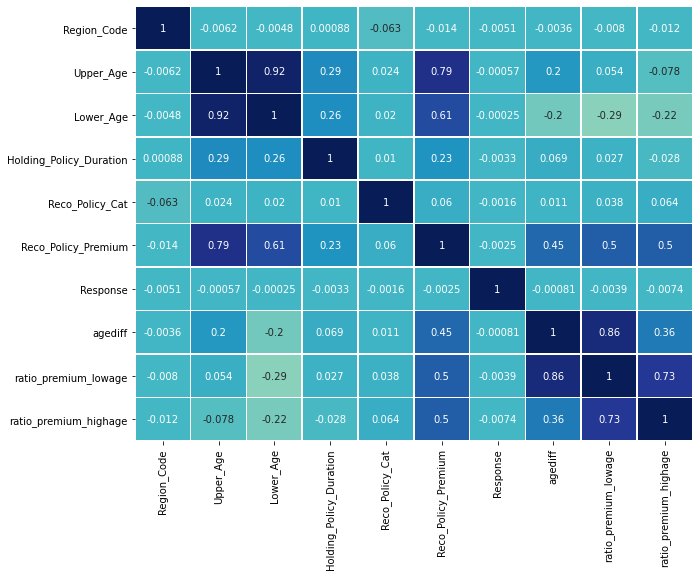

In [31]:
plt.figure(figsize=(10,8))

sns.heatmap(totaldf.drop(['ID'],axis = 1).corr(),
            annot=True,
            linewidths=.5,
            center=0,
            cbar=False,
            cmap="YlGnBu")

plt.show()

### pairPlot

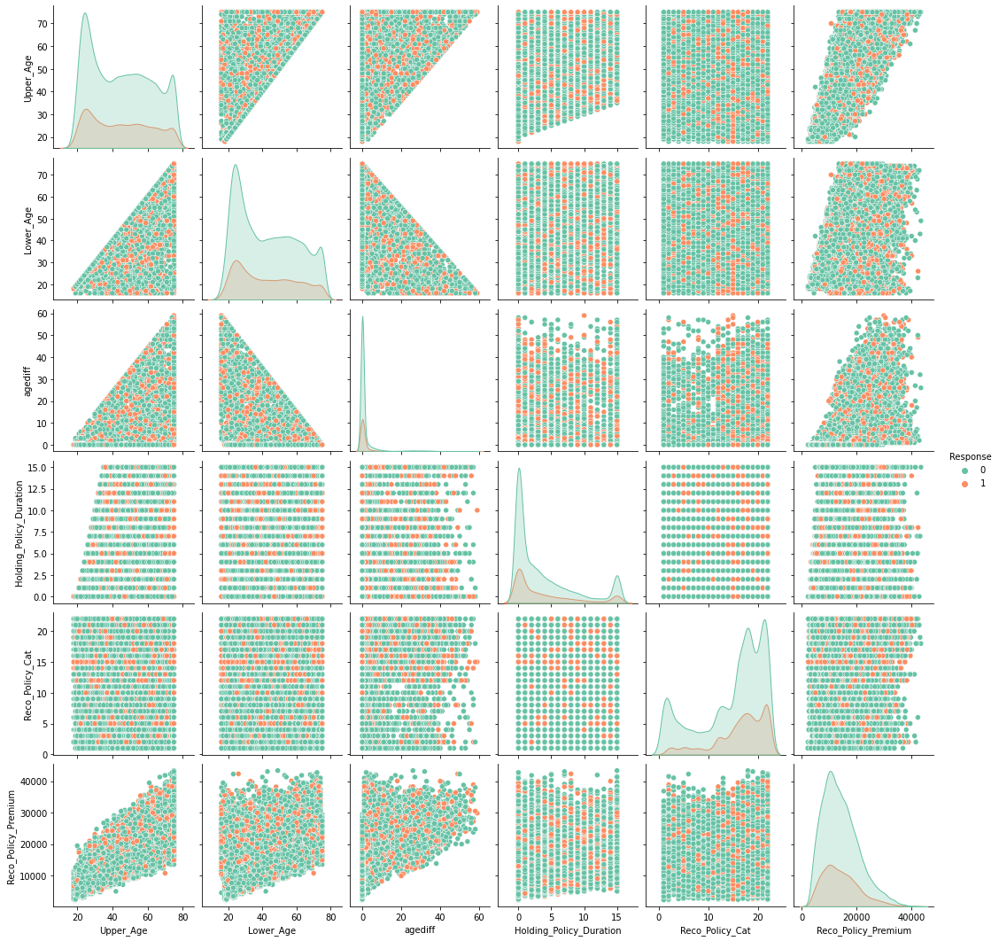

In [347]:
reqcols = ['Upper_Age', 'Lower_Age','agediff', 'Holding_Policy_Type','Holding_Policy_Duration',
       'Reco_Policy_Cat', 'Reco_Policy_Premium', 'Response']

sns.pairplot(totaldf[totaldf['Response']!=-999][reqcols],hue='Response',palette='Set2')

## installing catboost

In [52]:
!pip install catboost 

     |████████████████████████████████| 65.7MB 70kB/s 


In [32]:
totaldf_copy = totaldf.copy()

In [33]:
totaldf_copy.head()

,ID,City_Code,Region_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response,hpd,agediff,custtype,ratio_premium_lowage,ratio_premium_highage
0,1,C3,3213,Rented,Individual,36,36,No,X1,15.0,3,22,11628.0,0,vlong,0,oldcust,323.000000,323.000000
1,2,C5,1117,Owned,Joint,75,22,No,X2,-999.0,nc,22,30510.0,0,new,53,newcust,1386.818182,406.800000
2,3,C5,3732,Owned,Individual,32,32,No,X9,1.0,1,19,7450.0,1,small,0,oldcust,232.812500,232.812500
3,4,C24,4378,Owned,Joint,52,48,No,X1,15.0,3,19,17780.0,0,vlong,4,oldcust,370.416667,341.923077
4,5,C8,2190,Rented,Individual,44,44,No,X2,3.0,1,16,10404.0,0,small,0,oldcust,236.454545,236.454545


### logic to Handle new 222 regions in test data

In [34]:
newregions = [r for r in testf['Region_Code'].unique() if r not in trainf['Region_Code'].unique()]
len(newregions)

222

#### logic is to use a fix number like -9999 ( which is not present in existing region codes) and club all new regions into one label


In [35]:
def newregioncoder(x):
  if x in newregions:
    return -9999
  else:
    return x

In [36]:
totaldf_copy['Region_Code'] = totaldf_copy['Region_Code'].apply(lambda x : newregioncoder(x))

In [37]:
totaldf_copy[totaldf_copy['Region_Code'] < 0].Region_Code.unique()

array([-9999])

In [38]:
le = preprocessing.LabelEncoder()


In [39]:
totaldf_copy['Holding_Policy_Type'] = totaldf_copy['Holding_Policy_Type'].apply(lambda x : "pol" + str(x))
#totaldf_copy['Holding_Policy_Duration'] = le.fit_transform(totaldf_copy['Holding_Policy_Duration'])
totaldf_copy['Holding_Policy_Type'] = le.fit_transform(totaldf_copy['Holding_Policy_Type'])
totaldf_copy['Accomodation_Type'] = le.fit_transform(totaldf_copy['Accomodation_Type'])
totaldf_copy['Is_Spouse'] = le.fit_transform(totaldf_copy['Is_Spouse'])
totaldf_copy['Reco_Insurance_Type'] = le.fit_transform(totaldf_copy['Reco_Insurance_Type'])
totaldf_copy['Health Indicator'] = le.fit_transform(totaldf_copy['Health Indicator'])
totaldf_copy['hpd'] = le.fit_transform(totaldf_copy['hpd'])
totaldf_copy['custtype'] = le.fit_transform(totaldf_copy['custtype'])


In [40]:
enc_nom_city = (totaldf_copy.groupby('City_Code').size()) / len(totaldf_copy)
enc_nom_Region = (totaldf_copy.groupby('Region_Code').size()) / len(totaldf_copy)
enc_nom_hpt = (totaldf_copy.groupby('Holding_Policy_Type').size()) / len(totaldf_copy)


In [41]:
# totaldf_copy['City_Code'] = le.fit_transform(totaldf_copy['City_Code'])
totaldf_copy['Region_Code'] = le.fit_transform(totaldf_copy['Region_Code'])
# totaldf_copy['Holding_Policy_Type'] = le.fit_transform(totaldf_copy['Holding_Policy_Type'])


In [42]:
totaldf_copy['City_Code'] = totaldf_copy['City_Code'].apply(lambda x : enc_nom_city[x])
# totaldf_copy['Region_Code'] = totaldf_copy['Region_Code'].apply(lambda x : enc_nom_Region[x])
totaldf_copy['Holding_Policy_Type'] = totaldf_copy['Holding_Policy_Type'].apply(lambda x : enc_nom_hpt[x])

In [43]:
trainf2 = totaldf_copy[totaldf_copy['Response']!=-999]
testf2 = totaldf_copy[totaldf_copy['Response']==-999]

In [44]:
X = trainf2.drop(['ID','Response'],axis = 1)
y = trainf2['Response']

In [45]:
col2drop = ['Lower_Age']

In [59]:
col2drop = []

#### Train and validation split

In [60]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X.drop(col2drop,axis = 1), y, test_size=0.20,random_state=4)

In [61]:
X_train.head()

,City_Code,Region_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,hpd,agediff,custtype,ratio_premium_lowage,ratio_premium_highage
35767,0.022851,1997,1,1,58,20,0,8,-999.0,0.396962,20,21240.0,2,38,0,1062.000000,366.206897
28971,0.018848,859,1,0,28,28,0,0,2.0,0.161611,22,12114.0,3,0,1,432.642857,432.642857
4411,0.031519,2227,1,0,64,64,0,0,2.0,0.083646,18,13706.0,3,0,1,214.156250,214.156250
50567,0.031519,1183,1,0,40,40,0,0,1.0,0.161611,18,16152.0,3,0,1,403.800000,403.800000
21747,0.095670,897,0,0,63,63,0,0,15.0,0.083646,17,19008.0,4,0,1,301.714286,301.714286


In [62]:
cat_features = [1,2,3,6,7,10,12,14] ## index of the categorical columns

#### Light GBM using cross validations

In [223]:
from sklearn.metrics import log_loss
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.model_selection import StratifiedKFold
import lightgbm as lgb


def run_cv_model(train, test, target, model_fn, params={}, eval_fn=None,label='model', n_folds=5):
    kf = StratifiedKFold(n_splits=n_folds, shuffle = True, random_state = 228)
    fold_splits = kf.split(train, target)
    cv_scores = []
    pred_full_test = 0
    pred_train = np.zeros((train.shape[0]))
    feature_importances = pd.DataFrame()
    feature_importances['feature'] = test.columns
    i = 1
    for dev_index, val_index in fold_splits:
        print('-------------------------------------------')
        print('Started ' + label + ' fold ' + str(i) + f'/{n_folds}')
        dev_X, val_X = train.iloc[dev_index], train.iloc[val_index]
        dev_y, val_y = target.iloc[dev_index], target.iloc[val_index]
        params2 = params.copy()
        pred_val_y, pred_test_y, fi,model = model_fn(dev_X, dev_y, val_X, val_y, test, params2)
        feature_importances[f'fold_{i}'] = fi
        pred_full_test = pred_full_test + pred_test_y
        pred_train[val_index] = pred_val_y
        #if eval_fn is not None:
            #cv_score = eval_fn(val_y, pred_val_y)
        try:
            print(val_y.shape)
            print(pred_val_y.shape)
            print('f1 score is {}'.format(f1_score(val_y, pred_val_y, average='micro') ))
            cv_score=f1_score(val_y, pred_val_y, average='micro')
            print('cvscore is {}'.format(cv_score))
            cv_scores.append(cv_score)
            print(label + ' cv score {}: {}'.format(i, cv_score), '\n')
        except:
            print('in loop number {}'.format(i))
            
            break
        i += 1
    print('{} cv scores : {}'.format(label, cv_scores))
    print('{} cv mean score : {}'.format(label, np.mean(cv_scores)))
    print('{} cv std score : {}'.format(label, np.std(cv_scores)))
    pred_full_test = pred_full_test / n_folds
    results = {'label': label,
              'train': pred_train, 'test': pred_full_test,
              'cv': cv_scores, 'fi': feature_importances}
    return results,model

parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'boosting': 'gbdt',
    'num_class':1,
    'num_leaves': 10,
    'feature_fraction': 0.85,
    'bagging_fraction': 0.95,
    'bagging_freq': 10,
    'learning_rate': 0.005,
    'verbose': 1 }

def labeler(ypr,th = .5):
    ypr2 = np.zeros(len(ypr))
    for i in range(len(ypr)):
        if ypr[i] >= th:
            ypr2[i]=1
        else:  
            ypr2[i]=0
    return ypr2

def lgbmodel(dev_X, dev_y, val_X, val_y, test, params2):
    
    train_data = lgb.Dataset(dev_X, label=dev_y)
    test_data = lgb.Dataset(val_X, label=val_y)

   
    model = lgb.train(parameters,
                           train_data,
                           valid_sets=test_data,
                           num_boost_round=200,
                           early_stopping_rounds=40)
    feature_im = model.feature_importance()
    
    print('Predict 1/2')
    #pred_test_y = model.predict(val_X).argmax(axis=1)
    pred_test_y = model.predict(val_X)
    pred_test_y = labeler(pred_test_y)
    print('len of pred_test_y is {}'.format(pred_test_y.shape))
    print('Predict 2/2')
    #pred_test_y2 = model.predict(test).argmax(axis=1)
    pred_test_y2 = model.predict(test)
    pred_test_y2 = labeler(pred_test_y2)
    print('len of pred_test_y2 is {}'.format(pred_test_y2.shape))
    return pred_test_y, pred_test_y2, feature_im,model


    


In [224]:
n_folds = 10
results,model = run_cv_model(X_train, X_test, y_train, lgbmodel, parameters,f1_score, 'f1', n_folds=n_folds)


-------------------------------------------
Started f1 fold 1/10
[1]	valid_0's auc: 0.595965
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's auc: 0.595965
[3]	valid_0's auc: 0.600443
[4]	valid_0's auc: 0.599723
[5]	valid_0's auc: 0.599031
[6]	valid_0's auc: 0.599333
[7]	valid_0's auc: 0.599378
[8]	valid_0's auc: 0.597183
[9]	valid_0's auc: 0.597163
[10]	valid_0's auc: 0.597315
[11]	valid_0's auc: 0.595185
[12]	valid_0's auc: 0.595068
[13]	valid_0's auc: 0.596931
[14]	valid_0's auc: 0.596929
[15]	valid_0's auc: 0.596954
[16]	valid_0's auc: 0.5962
[17]	valid_0's auc: 0.597917
[18]	valid_0's auc: 0.598298
[19]	valid_0's auc: 0.598324
[20]	valid_0's auc: 0.599698
[21]	valid_0's auc: 0.600271
[22]	valid_0's auc: 0.599961
[23]	valid_0's auc: 0.600543
[24]	valid_0's auc: 0.600324
[25]	valid_0's auc: 0.600029
[26]	valid_0's auc: 0.600351
[27]	valid_0's auc: 0.600045
[28]	valid_0's auc: 0.600028
[29]	valid_0's auc: 0.601571
[30]	valid_0's auc: 0.601577
[31]	valid_0's

#### Xgoost algorithm 

In [310]:
import xgboost as xgb
xgb2 = xgb.XGBClassifier(max_depth=5, n_estimators=12000, learning_rate=0.05,objective='reg:logistic',
                         tree_method='auto',random_state=12,
                        eval_metric ="auc")

eval_set = [(X_train, y_train), (X_test,y_test)]

In [311]:
xgb2.fit(X_train, y_train,early_stopping_rounds=30, eval_metric=["auc"],eval_set=eval_set)


[0]	validation_0-auc:0.607943	validation_1-auc:0.60727
Multiple eval metrics have been passed: 'validation_1-auc' will be used for early stopping.

Will train until validation_1-auc hasn't improved in 30 rounds.
[1]	validation_0-auc:0.609639	validation_1-auc:0.60743
[2]	validation_0-auc:0.609655	validation_1-auc:0.607242
[3]	validation_0-auc:0.609536	validation_1-auc:0.606996
[4]	validation_0-auc:0.610505	validation_1-auc:0.606998
[5]	validation_0-auc:0.610273	validation_1-auc:0.607615
[6]	validation_0-auc:0.611377	validation_1-auc:0.608419
[7]	validation_0-auc:0.611856	validation_1-auc:0.609033
[8]	validation_0-auc:0.612456	validation_1-auc:0.609145
[9]	validation_0-auc:0.612154	validation_1-auc:0.609185
[10]	validation_0-auc:0.619743	validation_1-auc:0.613814
[11]	validation_0-auc:0.6202	validation_1-auc:0.614782
[12]	validation_0-auc:0.620316	validation_1-auc:0.614674
[13]	validation_0-auc:0.620498	validation_1-auc:0.614947
[14]	validation_0-auc:0.62057	validation_1-auc:0.615111
[15

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='auc',
              gamma=0, learning_rate=0.05, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=12000, n_jobs=1,
              nthread=None, objective='reg:logistic', random_state=12,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, tree_method='auto', verbosity=1)

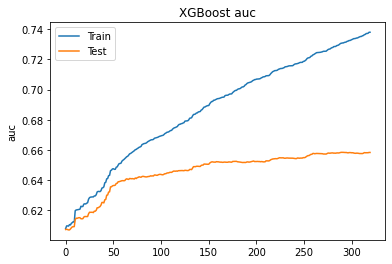

In [312]:
results2 = xgb2.evals_result()
epochs = len(results2['validation_0']['auc'])
x_axis = range(0, epochs)
# plot log loss
fig, ax = plt.subplots()
ax.plot(x_axis, results2['validation_0']['auc'], label='Train')
ax.plot(x_axis, results2['validation_1']['auc'], label='Test')
ax.legend()
plt.ylabel('auc')
plt.title('XGBoost auc')
plt.show()

In [313]:
pred_xgb_test = xgb2.predict_proba(data=X_test)
print(roc_auc_score(y_test, pred_xgb_test[:, 1]))


0.6584146553256833


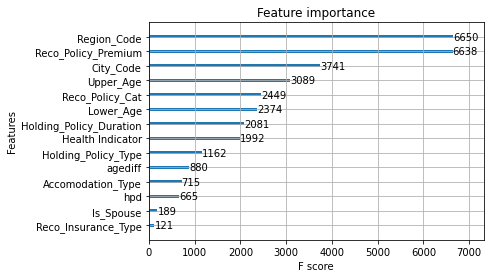

In [229]:
from xgboost import plot_importance

plot_importance(xgb2)

In [ ]:
pred_xgb_test = xgb2.predict_proba(data=testf2[X_test.columns].values)

testf2['Response'] = pred_xgb_test[:,1]
sub1 = testf[sampsub.columns]
sub1.to_csv("/content/gdrive/MyDrive/av_model/sub5.csv",index = None)

In [344]:
# feature_important = xgb2.get_booster().get_score(importance_type='weight')
# keys = list(feature_important.keys())
# values = list(feature_important.values())

# data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
# data.plot(kind='barh')

#### checking if policy premium has some variation in train and validation

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


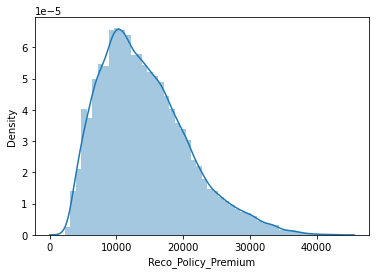

In [185]:
sns.distplot(trainf2['Reco_Policy_Premium'],kde=True)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


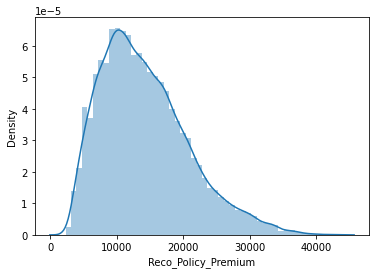

In [67]:
sns.distplot(X_train['Reco_Policy_Premium'],kde=True)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


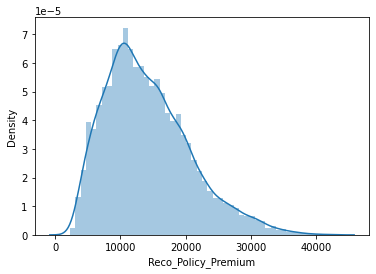

In [68]:
sns.distplot(X_test['Reco_Policy_Premium'],kde=True)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


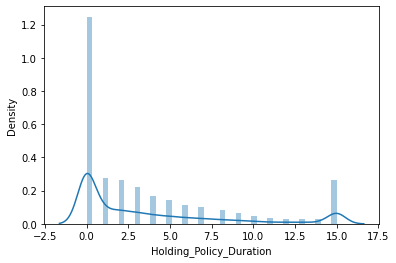

In [186]:
sns.distplot(trainf2['Holding_Policy_Duration'],kde=True)

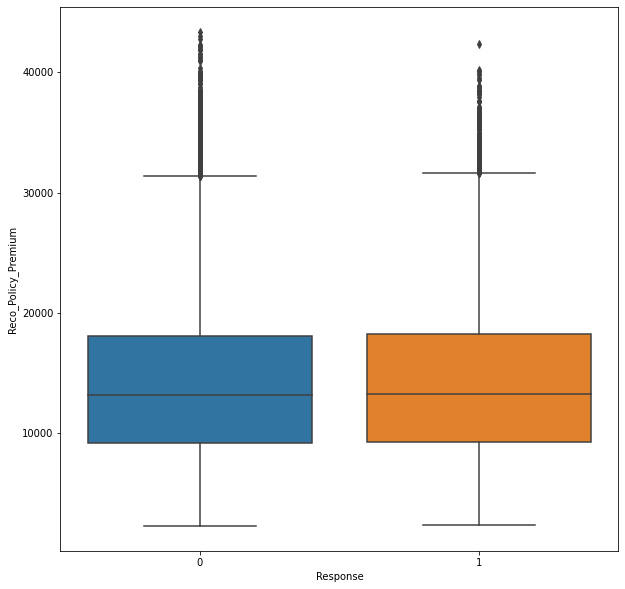

In [61]:
fig,zx = plt.subplots(figsize = (10,10))
sns.boxplot(x = trainf2['Response'],y = trainf2['Reco_Policy_Premium'])

## catboost

In [49]:
### idenfitication of the class weights
import sklearn.utils as sku
import sklearn.model_selection as skms

class_weights = sku.class_weight.compute_class_weight('balanced', np.unique(y_train), y_train)
class_weights = dict(enumerate(class_weights))
class_weights

{0: 0.6596389447073313, 1: 2.0660339051872905}

In [53]:
from catboost import CatBoostClassifier


In [194]:

clf = CatBoostClassifier(
    iterations=50000,early_stopping_rounds=50,
    random_seed=42,
    learning_rate=0.001,custom_loss=['AUC'],
    class_weights = class_weights
)

clf.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_test, y_test),plot=True
)



pred_catboost = clf.predict(data=X_test)
print(classification_report(y_test,pred_catboost))
print(roc_auc_score(y_test, clf.predict_proba(X_test)[:, 1]))

pred_catboost_test = clf.predict_proba(data=testf2[X_test.columns])
testf2['Response'] = pred_catboost_test[:,1]
sub1 = testf2[sampsub.columns]
sub1.to_csv("/content/gdrive/MyDrive/av_model/sub7.csv",index = None)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Streaming output truncated to the last 5000 lines.
23871:	learn: 0.5505346	test: 0.5770585	best: 0.5770580 (23868)	total: 47m 24s	remaining: 51m 53s
23872:	learn: 0.5505305	test: 0.5770563	best: 0.5770563 (23872)	total: 47m 24s	remaining: 51m 53s
23873:	learn: 0.5505269	test: 0.5770551	best: 0.5770551 (23873)	total: 47m 25s	remaining: 51m 53s
23874:	learn: 0.5505255	test: 0.5770551	best: 0.5770551 (23874)	total: 47m 25s	remaining: 51m 53s
23875:	learn: 0.5505237	test: 0.5770551	best: 0.5770551 (23875)	total: 47m 25s	remaining: 51m 53s
23876:	learn: 0.5505220	test: 0.5770552	best: 0.5770551 (23875)	total: 47m 25s	remaining: 51m 53s
23877:	learn: 0.5505209	test: 0.5770552	best: 0.5770551 (23875)	total: 47m 25s	remaining: 51m 53s
23878:	learn: 0.5505198	test: 0.5770553	best: 0.5770551 (23875)	total: 47m 26s	remaining: 51m 53s
23879:	learn: 0.5505182	test: 0.5770547	best: 0.5770547 (23879)	total: 47m 26s	remaining: 51m 53s
23880:	learn: 0.5505173	test: 0.5770547	best: 0.5770547 (23880)	tot

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [327]:
##Learning rate set to 0.050148


### Cross validation

In [54]:
kfold, scores = KFold(n_splits=5, shuffle=True, random_state=0), list()
for train, test in kfold.split(X_train):
    xtrain, xtest = X_train.iloc[train], X_train.iloc[test]
    ytrain, ytest = y_train.iloc[train], y_train.iloc[test]
    
    model = CatBoostClassifier(random_state=20, max_depth=6, task_type="CPU", n_estimators=1000, verbose=500)
    
    model.fit(xtrain, ytrain, cat_features=cat_features)
    preds = model.predict(xtest)
    # score = f1_score(ytest, preds, average="weighted")
    score = roc_auc_score(ytest, model.predict_proba(xtest)[:, 1])

    scores.append(score)
    print(score)
print("Average: ", sum(scores)/len(scores))

Learning rate set to 0.04559
0:	learn: 0.6776327	total: 95.4ms	remaining: 1m 35s
500:	learn: 0.4300388	total: 21.7s	remaining: 21.6s
999:	learn: 0.4079733	total: 45.6s	remaining: 0us
0.7956943973891254
Learning rate set to 0.04559
0:	learn: 0.6772737	total: 45.3ms	remaining: 45.3s
500:	learn: 0.4297318	total: 21.5s	remaining: 21.4s
999:	learn: 0.4060813	total: 45.3s	remaining: 0us
0.7913325933429605
Learning rate set to 0.04559
0:	learn: 0.6777760	total: 42ms	remaining: 41.9s
500:	learn: 0.4283552	total: 22.1s	remaining: 22.1s
999:	learn: 0.4048695	total: 46.2s	remaining: 0us
0.7844989138029179
Learning rate set to 0.04559
0:	learn: 0.6776878	total: 47.7ms	remaining: 47.6s
500:	learn: 0.4288472	total: 22.5s	remaining: 22.4s
999:	learn: 0.4052867	total: 46.1s	remaining: 0us
0.7896568226668111
Learning rate set to 0.04559
0:	learn: 0.6776985	total: 44.9ms	remaining: 44.9s
500:	learn: 0.4301433	total: 21.3s	remaining: 21.2s
999:	learn: 0.4068588	total: 44.9s	remaining: 0us
0.7921128749266

In [346]:
kfold, scores = KFold(n_splits=5, shuffle=True, random_state=0), list()
for train, test in kfold.split(X_train):
    xtrain, xtest = X_train.iloc[train], X_train.iloc[test]
    ytrain, ytest = y_train.iloc[train], y_train.iloc[test]
    
    model = CatBoostClassifier(random_state=27, max_depth=6, task_type="CPU", n_estimators=5000, verbose=500,custom_loss=['AUC'],class_weights = class_weights,
                               early_stopping_rounds=50)
    
    model.fit(xtrain, ytrain, cat_features=cat_features)
    preds = model.predict(xtest)
    # score = f1_score(ytest, preds, average="weighted")
    score = roc_auc_score(ytest, model.predict_proba(xtest)[:, 1])

    scores.append(score)
    print(score)
print("Average: ", sum(scores)/len(scores))

Learning rate set to 0.010421
0:	learn: 0.6910324	total: 47.6ms	remaining: 3m 57s
500:	learn: 0.5527983	total: 19.2s	remaining: 2m 52s
1000:	learn: 0.5415744	total: 40.9s	remaining: 2m 43s
1500:	learn: 0.5314182	total: 1m 4s	remaining: 2m 29s
2000:	learn: 0.5226967	total: 1m 28s	remaining: 2m 12s
2500:	learn: 0.5148687	total: 1m 51s	remaining: 1m 51s
3000:	learn: 0.5072861	total: 2m 15s	remaining: 1m 30s
3500:	learn: 0.5005041	total: 2m 39s	remaining: 1m 8s
4000:	learn: 0.4938860	total: 3m 4s	remaining: 46.1s
4500:	learn: 0.4873343	total: 3m 28s	remaining: 23.2s
4999:	learn: 0.4809713	total: 3m 53s	remaining: 0us
0.7946975611432724
Learning rate set to 0.010421
0:	learn: 0.6909018	total: 47.3ms	remaining: 3m 56s
500:	learn: 0.5519310	total: 19.2s	remaining: 2m 52s
1000:	learn: 0.5412680	total: 40.3s	remaining: 2m 41s
1500:	learn: 0.5310959	total: 1m 3s	remaining: 2m 27s
2000:	learn: 0.5222205	total: 1m 27s	remaining: 2m 10s
2500:	learn: 0.5134144	total: 1m 50s	remaining: 1m 50s
3000:	l

### prediction on validation data

## using class weights

In [63]:
model = CatBoostClassifier(random_state=27, task_type="CPU", n_estimators=1000, max_depth=6, verbose=500)
model.fit(X_train, y_train, cat_features=cat_features)
preds1 = model.predict_proba(X_test)

print(roc_auc_score(y_test, preds1[:, 1])) ## roc_auc for validaton data


Learning rate set to 0.050148
0:	learn: 0.6760787	total: 63.2ms	remaining: 1m 3s
500:	learn: 0.4288232	total: 27s	remaining: 26.9s
999:	learn: 0.4070240	total: 56.4s	remaining: 0us
0.7983084960505396


In [ ]:
while 3==3:
  r = 4

### without using class weights

In [337]:
model = CatBoostClassifier(random_state=27, task_type="CPU", n_estimators=1000, max_depth=6, verbose=500)
model.fit(X_train, y_train, cat_features=cat_features)
preds1 = model.predict_proba(X_test)
print(roc_auc_score(y_test, preds1[:, 1]))


Learning rate set to 0.050148
0:	learn: 0.6771798	total: 51.8ms	remaining: 51.7s
500:	learn: 0.4296578	total: 24.9s	remaining: 24.8s
999:	learn: 0.4082327	total: 52.5s	remaining: 0us
0.8004358253492043


## model using total data

In [64]:

model = CatBoostClassifier(random_state=27, task_type="CPU", n_estimators=1000, max_depth=6, verbose=500)
model.fit(X.drop(col2drop,axis = 1), y, cat_features=cat_features)
preds1 = model.predict_proba(testf2[X_test.columns])


Learning rate set to 0.055162
0:	learn: 0.6744754	total: 84.8ms	remaining: 1m 24s
500:	learn: 0.4251044	total: 32.7s	remaining: 32.6s
999:	learn: 0.4051001	total: 1m 8s	remaining: 0us


In [65]:
testf2['Response'] = preds1[:,1]
sub1 = testf2[sampsub.columns]
sub1.to_csv("/content/gdrive/MyDrive/av_model/sub11.csv",index = None)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [296]:
fimp = pd.DataFrame(clf.feature_names_,columns = ['featurename'])
fimp.index = fimp['featurename']
fimp['imp'] = clf.feature_importances_
fimp.drop(['featurename'],axis = 1,inplace=True)

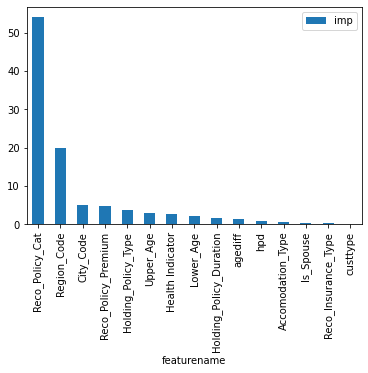

In [303]:
fimp.sort_values(by = ['imp'],ascending=False).plot(kind='bar')

In [192]:
pred_catboost_test[:,1]

array([0.34167056, 0.45542565, 0.72623963, ..., 0.05865625, 0.47760865,
       0.22714316])

In [190]:
clf.predict(data=testf2[X_test.columns])

array([0, 0, 1, ..., 0, 0, 0])

In [193]:
testf2['Response'] = pred_catboost_test[:,1]
sub1 = testf2[sampsub.columns]
sub1.to_csv("/content/gdrive/MyDrive/av_model/sub7.csv",index = None)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


15

### Deep learning :: Not getting good results ( haven't tried much changes in architectures and it may work)

In [246]:
import tensorflow as tf
print("TF version:-", tf.__version__)
from tensorflow import keras as keras

from keras.models import Sequential
from keras import optimizers
from keras.models import Model
from keras import optimizers, applications
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras.layers import Dense, Dropout,  Input,BatchNormalization

TF version:- 2.4.1


In [283]:
model = Sequential()
model.add(Dense(2000, activation='relu',input_shape = (X_train.shape[1],)))    
model.add(Dropout(0.2))
model.add(Dense(1000,activation='relu'))                        
model.add(Dropout(0.2))
model.add(Dense(500,activation='relu'))                        
model.add(Dropout(0.2))
model.add(Dense(300,activation='relu'))                        
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

sgd = optimizers.SGD(lr = 0.01)   

model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['AUC'])    

In [284]:
ES_PATIENCE = 30
RLROP_PATIENCE = 3
DECAY_DROP = 0.5
epochs = 1000
es = EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop = ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)


In [285]:
callback_list = [es, rlrop]

In [286]:

history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs, 
                      batch_size=256, class_weight=class_weights,
                      callbacks=[callback_list]
                     )

Epoch 1/1000
160/160 [==============================] - 16s 97ms/step - loss: 132.6621 - auc: 0.5042 - val_loss: 0.7491 - val_auc: 0.4968
Epoch 2/1000
160/160 [==============================] - 15s 96ms/step - loss: 1.5118 - auc: 0.5029 - val_loss: 0.6397 - val_auc: 0.4988
Epoch 3/1000
160/160 [==============================] - 15s 96ms/step - loss: 0.8389 - auc: 0.4959 - val_loss: 0.6856 - val_auc: 0.4974
Epoch 4/1000
160/160 [==============================] - 15s 96ms/step - loss: 0.7495 - auc: 0.4929 - val_loss: 0.6910 - val_auc: 0.5000
Epoch 5/1000
160/160 [==============================] - 15s 94ms/step - loss: 0.7094 - auc: 0.4999 - val_loss: 0.6899 - val_auc: 0.5000

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
Epoch 6/1000
160/160 [==============================] - 16s 97ms/step - loss: 0.7039 - auc: 0.5036 - val_loss: 0.6899 - val_auc: 0.5000
Epoch 7/1000
160/160 [==============================] - 16s 98ms/step - loss: 0.6957 - auc: 0.5008 - 

In [270]:
history.history.keys()

dict_keys(['loss', 'auc', 'val_loss', 'val_auc', 'lr'])

In [271]:
def plotHistory(history):
    print("Min. Validation AUC Score",min(history.history["val_auc"]))
    pd.DataFrame(history.history).plot(figsize=(12,6))
    plt.show()

Min. Validation AUC Score 0.4990484118461609


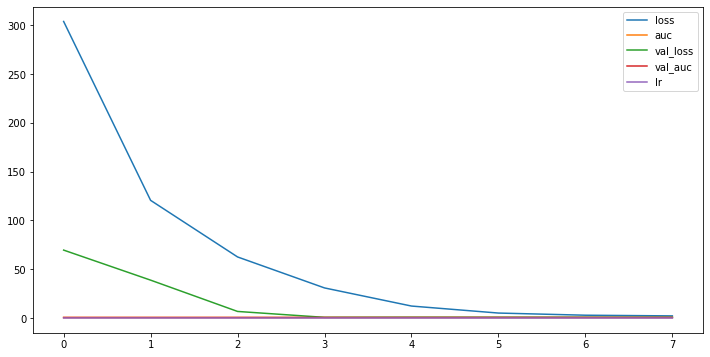

In [272]:
plotHistory(history)

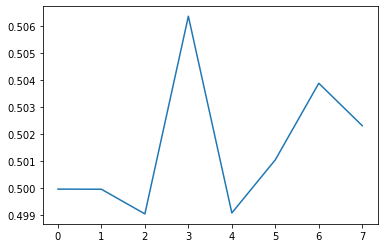

In [274]:
plt.plot(history.history['val_auc'])

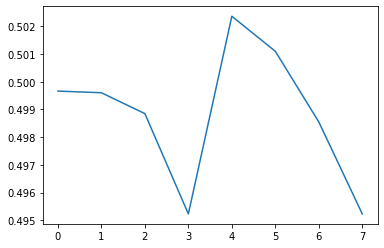

In [275]:
plt.plot(history.history['auc'])